#  Procesamiento Digital de Imágenes - TP06: Restauración de imágenes

**Objetivos de la guía:**

* Comprender la dinámica de los modelos de ruido y sus parámetros.

* Formular estrategias de filtrado en dominio espacial y frecuencial

* Experimentar con filtros de medias, de orden y sus efectos en cascada.

* Estudiar los efectos de los filtros de deconvolución.

In [1]:
# Configuración Inicial y Función de Error
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, IntSlider
import ipywidgets as widgets
import scipy.ndimage as ndimage # Útil para filtros no lineales

def mostrar_imagenes(imagenes, titulos, figsize=(15, 5)):
    n = len(imagenes)
    fig, axs = plt.subplots(1, n, figsize=figsize)
    if n == 1: axs = [axs]
    for i in range(n):
        img = imagenes[i]
        if len(img.shape) == 3: img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[i].imshow(img, cmap='gray', vmin=0, vmax=255)
        axs[i].set_title(titulos[i])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

# Cómputo del ECM (MSE, mean square error) provisto en la guía
def mse(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

print("Entorno configurado. ¡Asegúrate de subir las imágenes necesarias ('sangre.jpg', 'img_degradada.tif', imágenes FAMILIA, etc.)!")

Entorno configurado. ¡Asegúrate de subir las imágenes necesarias ('sangre.jpg', 'img_degradada.tif', imágenes FAMILIA, etc.)!


## Ejercicio 1: Modelos de ruido

Generar distintos tipos de ruido:
* ruido gaussiano,
* ruido uniforme,
* sal y pimienta,
* impulsivo
* exponencial

Analizar su impacto sobre una imagen de prueba compuesta por 3 franjas de grises constantes.

In [2]:
def aplicar_ruido_gaussiano(img, media, std):
    ruido_gaussiano0 = np.random.normal(media, std, (img.shape[0], img.shape[1]))
    return np.clip(img.astype(np.float32) + ruido_gaussiano0, 0, 255).astype(np.uint8)

def aplicar_ruido_salpi(img, ratio):
    # generar coordenadas aleatorias en la imagen
    total_pixeles = img.shape[0] * img.shape[1]
    total_pixeles_ruidosos = int(total_pixeles * ratio)
    total_pixeles_ruidosos = (total_pixeles_ruidosos // 2) * 2  # forzar que sea par

    pixeles_ruidosos = np.random.choice(total_pixeles, total_pixeles_ruidosos, replace=False)

    # la mitad de las coordenadas seran blancos (sal) y la otra mitad negros (pimienta)
    img_ruidosa = img.copy()
    img_ruidosa.ravel()[pixeles_ruidosos[:total_pixeles_ruidosos//2]] = 255 # blancos
    img_ruidosa.ravel()[pixeles_ruidosos[total_pixeles_ruidosos//2:]] = 0 # negros

    return img_ruidosa

def aplicar_ruido_exponencial(img, beta):
    # mismo tamaño que img
    ruido_exponencial = np.random.exponential(beta, (img.shape[0], img.shape[1]))
    # media cero
    ruido_exponencial = ruido_exponencial - beta

    # el ruido se suma
    img_ruidosa = img.astype(np.float32) + ruido_exponencial

    # controlar desbordamientos
    return np.clip(img_ruidosa, 0, 255).astype(np.uint8)

### Ruido Gaussiano

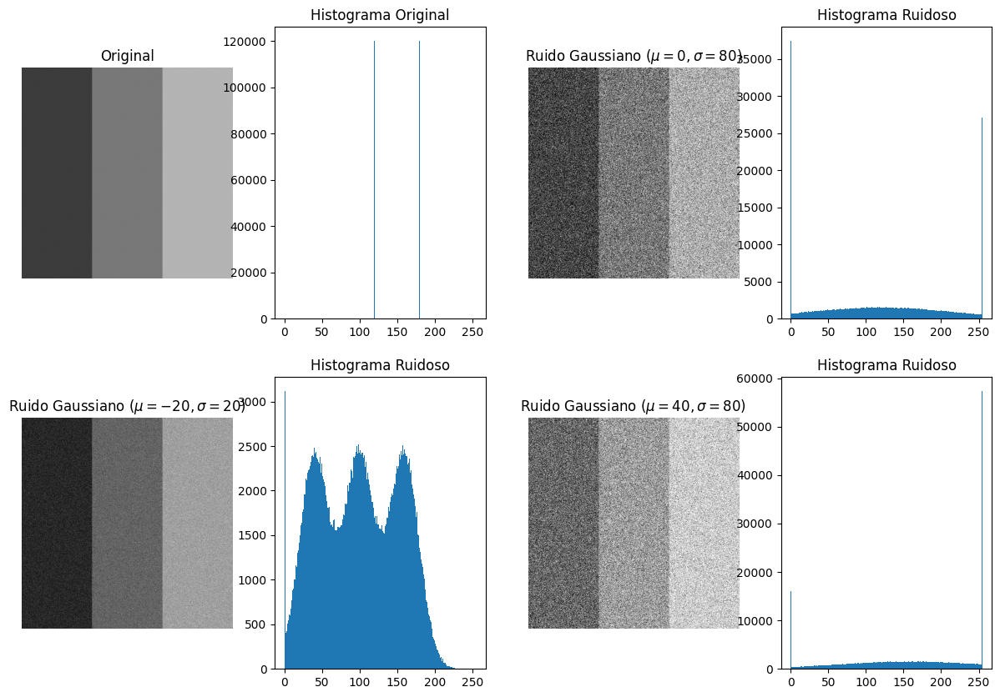

In [3]:
img_franjas = np.zeros((600, 600), dtype=np.uint8)
img_franjas[:, :200] = 60   # Oscuro
img_franjas[:, 200:400] = 120 # Medio
img_franjas[:, 400:] = 180  # Claro

media0, std0 = 0, 80
media1, std1 = -20, 20
media2, std2 = 40, 80

img_ruidosa0 = aplicar_ruido_gaussiano(img_franjas, media0, std0)
img_ruidosa1 = aplicar_ruido_gaussiano(img_franjas, media1, std1)
img_ruidosa2 = aplicar_ruido_gaussiano(img_franjas, media2, std2)

# Visualización
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
ax[0][0].imshow(img_franjas, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title("Original"); ax[0][0].axis('off')
ax[0][1].hist(img_franjas.ravel(), bins=256, range=(0,255)); ax[0][1].set_title("Histograma Original")

ax[0][2].imshow(img_ruidosa0, cmap='gray', vmin=0, vmax=255); ax[0][2].set_title(f"Ruido Gaussiano ($\\mu = {media0}, \\sigma = {std0}$)"); ax[0][2].axis('off')
ax[0][3].hist(img_ruidosa0.ravel(), bins=256, range=(0,255)); ax[0][3].set_title("Histograma Ruidoso")

ax[1][0].imshow(img_ruidosa1, cmap='gray', vmin=0, vmax=255); ax[1][0].set_title(f"Ruido Gaussiano ($\\mu = {media1}, \\sigma = {std1}$)"); ax[1][0].axis('off')
ax[1][1].hist(img_ruidosa1.ravel(), bins=256, range=(0,255)); ax[1][1].set_title("Histograma Ruidoso")

ax[1][2].imshow(img_ruidosa2, cmap='gray', vmin=0, vmax=255); ax[1][2].set_title(f"Ruido Gaussiano ($\\mu = {media2}, \\sigma = {std2}$)"); ax[1][2].axis('off')
ax[1][3].hist(img_ruidosa2.ravel(), bins=256, range=(0,255)); ax[1][3].set_title("Histograma Ruidoso")
plt.show();

### Ruido Sal y Pimienta

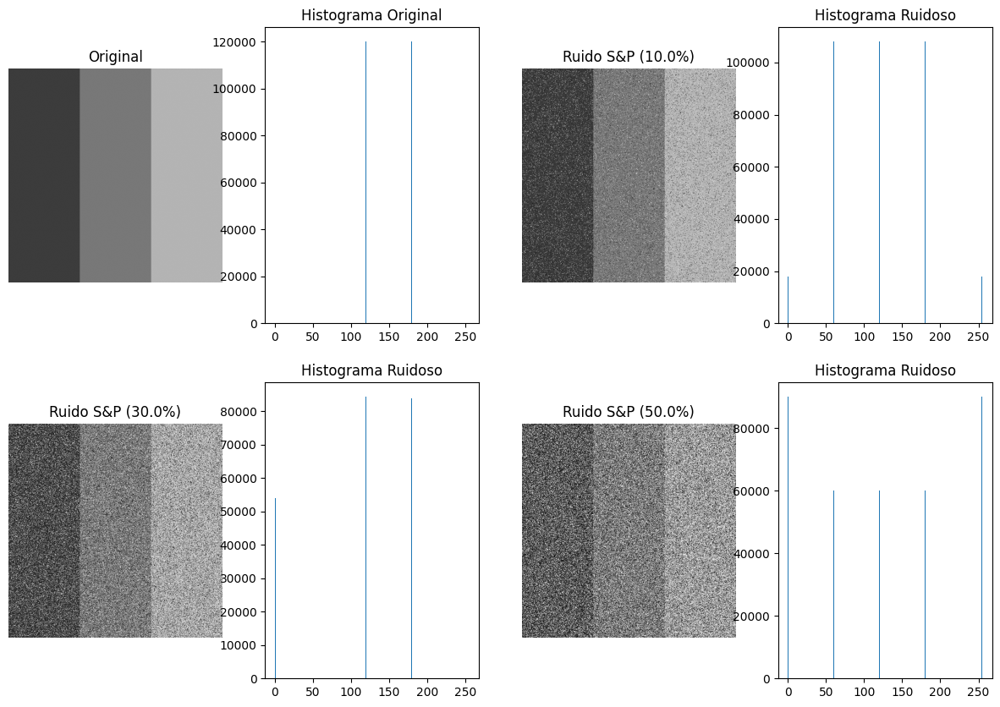

In [4]:
# 2. Generar Ruido Gaussiano con media 0
ratio0 = 0.1
ratio1 = 0.3
ratio2 = 0.5
img_ruidosa0 = aplicar_ruido_salpi(img_franjas, ratio0)
img_ruidosa1 = aplicar_ruido_salpi(img_franjas, ratio1)
img_ruidosa2 = aplicar_ruido_salpi(img_franjas, ratio2)

# Visualización
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
ax[0][0].imshow(img_franjas, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title("Original"); ax[0][0].axis('off')
ax[0][1].hist(img_franjas.ravel(), bins=256, range=(0,255)); ax[0][1].set_title("Histograma Original")

ax[0][2].imshow(img_ruidosa0, cmap='gray', vmin=0, vmax=255); ax[0][2].set_title(f"Ruido S&P ({ratio0*100}%)"); ax[0][2].axis('off')
ax[0][3].hist(img_ruidosa0.ravel(), bins=256, range=(0,255)); ax[0][3].set_title("Histograma Ruidoso")

ax[1][0].imshow(img_ruidosa1, cmap='gray', vmin=0, vmax=255); ax[1][0].set_title(f"Ruido S&P ({ratio1*100}%)"); ax[1][0].axis('off')
ax[1][1].hist(img_ruidosa1.ravel(), bins=256, range=(0,255)); ax[1][1].set_title("Histograma Ruidoso")

ax[1][2].imshow(img_ruidosa2, cmap='gray', vmin=0, vmax=255); ax[1][2].set_title(f"Ruido S&P ({ratio2*100}%)"); ax[1][2].axis('off')
ax[1][3].hist(img_ruidosa2.ravel(), bins=256, range=(0,255)); ax[1][3].set_title("Histograma Ruidoso")
plt.show();

### Ruido exponencial

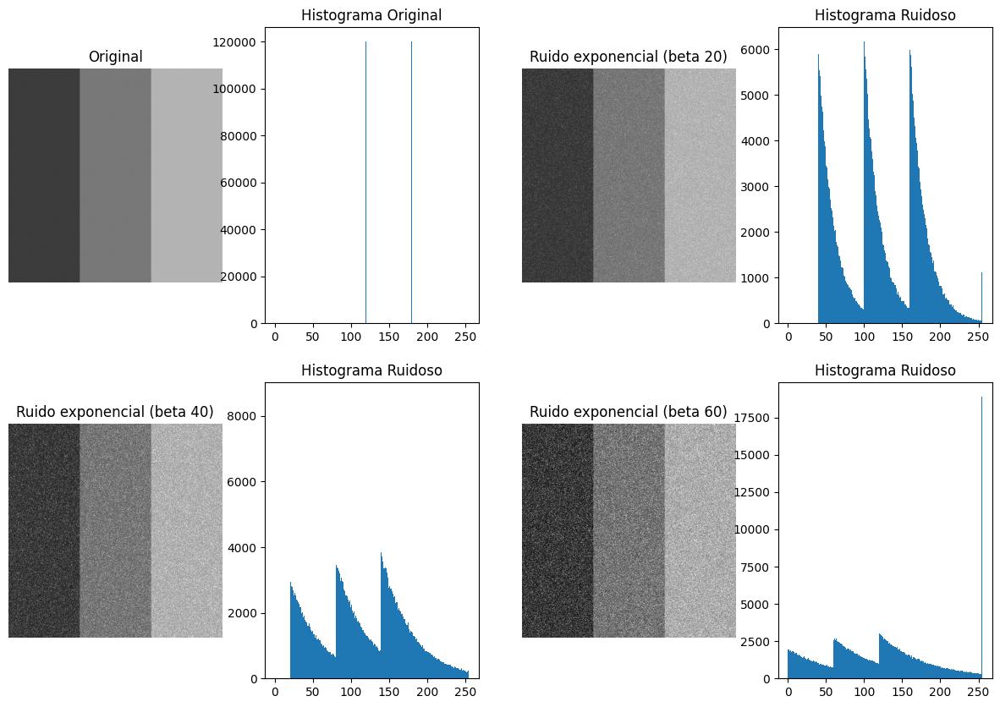

In [5]:
# 2. Generar Ruido Gaussiano con media 0
beta0 = 20
beta1 = 40
beta2 = 60
img_ruidosa0 = aplicar_ruido_exponencial(img_franjas, beta0)
img_ruidosa1 = aplicar_ruido_exponencial(img_franjas, beta1)
img_ruidosa2 = aplicar_ruido_exponencial(img_franjas, beta2)

# Visualización
fig, ax = plt.subplots(2, 4, figsize=(15, 10))
ax[0][0].imshow(img_franjas, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title("Original"); ax[0][0].axis('off')
ax[0][1].hist(img_franjas.ravel(), bins=256, range=(0,255)); ax[0][1].set_title("Histograma Original")

ax[0][2].imshow(img_ruidosa0, cmap='gray', vmin=0, vmax=255); ax[0][2].set_title(f"Ruido exponencial (beta {beta0})"); ax[0][2].axis('off')
ax[0][3].hist(img_ruidosa0.ravel(), bins=256, range=(0,255)); ax[0][3].set_title("Histograma Ruidoso")

ax[1][0].imshow(img_ruidosa1, cmap='gray', vmin=0, vmax=255); ax[1][0].set_title(f"Ruido exponencial (beta {beta1})"); ax[1][0].axis('off')
ax[1][1].hist(img_ruidosa1.ravel(), bins=256, range=(0,255)); ax[1][1].set_title("Histograma Ruidoso")

ax[1][2].imshow(img_ruidosa2, cmap='gray', vmin=0, vmax=255); ax[1][2].set_title(f"Ruido exponencial (beta {beta2})"); ax[1][2].axis('off')
ax[1][3].hist(img_ruidosa2.ravel(), bins=256, range=(0,255)); ax[1][3].set_title("Histograma Ruidoso")
plt.show();

In [6]:
#  Generación de Ruido y Análisis de Histogramas
def modelos_de_ruido(media=0, std=1):
    # 1. Generar imagen de 600x600 con 3 franjas verticales de grises
    img_franjas = np.zeros((600, 600), dtype=np.uint8)
    img_franjas[:, :200] = 60   # Oscuro
    img_franjas[:, 200:400] = 120 # Medio
    img_franjas[:, 400:] = 180  # Claro

    # 2. Generar Ruido con media 0
    img_ruidosa = aplicar_ruido_gaussiano(img_franjas, media, std)

    # Visualización
    fig, ax = plt.subplots(2, 2, figsize=(10, 8))
    ax[0][0].imshow(img_franjas, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title("Original")
    ax[0][1].hist(img_franjas.ravel(), bins=256, range=(0,255)); ax[0][1].set_title("Histograma Original")

    ax[1][0].imshow(img_ruidosa, cmap='gray', vmin=0, vmax=255); ax[1][0].set_title("Con Ruido Gaussiano")
    ax[1][1].hist(img_ruidosa.ravel(), bins=256, range=(0,255)); ax[1][1].set_title("Histograma Ruidoso")
    plt.show();

interact(
    modelos_de_ruido,
    media=FloatSlider(min=0, max=100, step=0.01, value=0),
    std=FloatSlider(min=1, max=100, step=0.01, value=0),
);

interactive(children=(FloatSlider(value=0.0, description='media', step=0.01), FloatSlider(value=1.0, descripti…

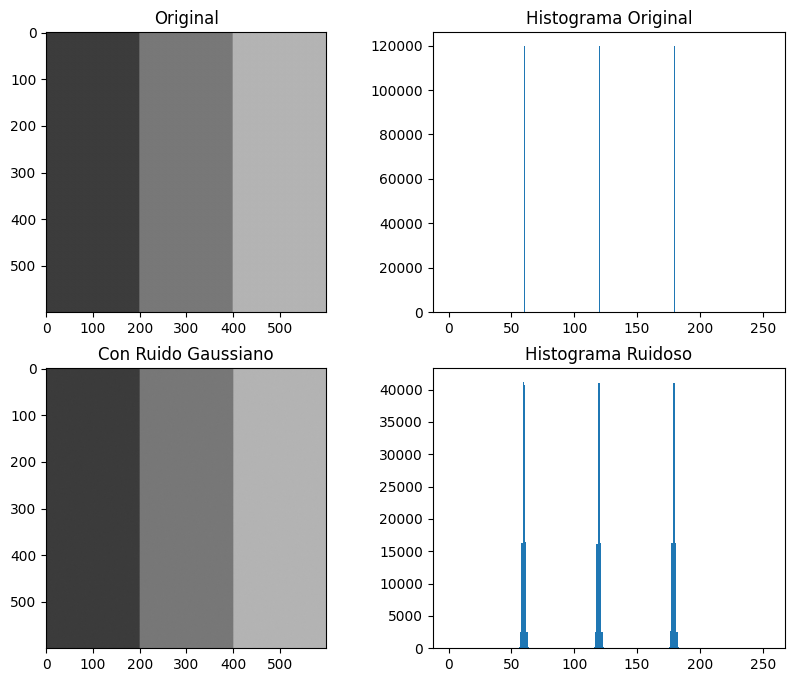

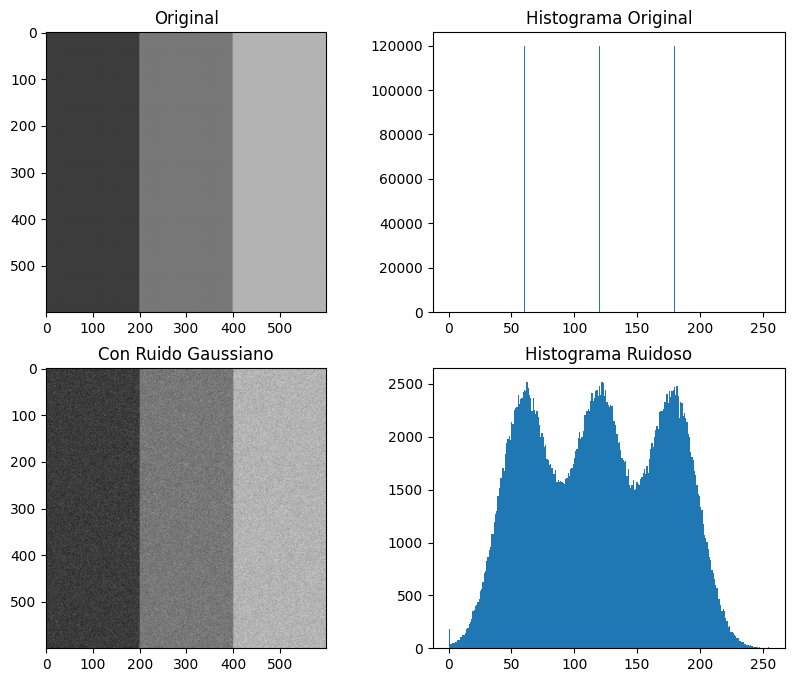

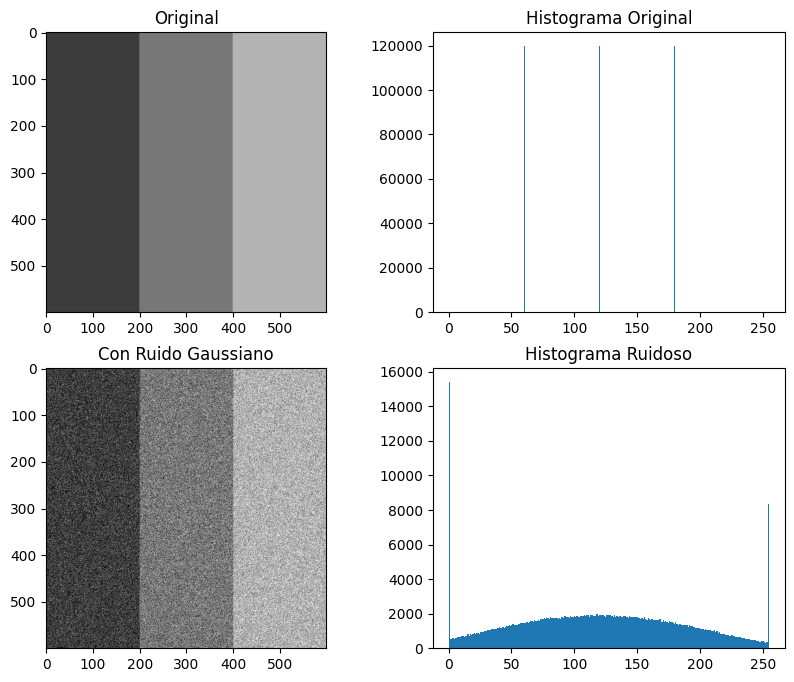

In [24]:
modelos_de_ruido(media=0, std=1)
modelos_de_ruido(media=0, std=20)
modelos_de_ruido(media=0, std=50)

Como en cualquier distribución de Gauss, el desvío estandar "ensancha" la campana, haciendo que el nivel de gris del ruido sea potencialmente más lejano al nivel original.

En el ruido exponencial sucede algo parecido, cuánto mayor es `beta`, más alejado del gris original estará el ruido (y más ruido habrá).

En cuanto al ruido de S&P, en el histograma lo que cambia es la aparición barras en los extremos del histograma, correspondientes a los píxeles blancos y negros (sal y pimienta).

## Ejercicio 2: Filtros de medias

Implementaremos filtros de media geométrica y contra-armónica sobre la imagen **sangre.jpg** contaminada con ruido mixto.

In [25]:
def aplicar_filtro_media_geometrica(img, ksize):
    padsize = (ksize - 1) // 2 # Calcular el tamaño del padding necesario

    # se agregan bordes (padding)
    im_p = cv2.copyMakeBorder(np.copy(img), padsize, padsize, padsize, padsize, cv2.BORDER_CONSTANT, value=1).astype(np.float64)

    im_f_mg = np.zeros(img.shape)

    # aplicar filtro
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            window = im_p[i:i + ksize, j:j + ksize] # Extraer la ventana de la imagen con padding
            product = np.prod(window)
            im_f_mg[i, j] = product ** (1 / (ksize ** 2))

    # manejar desbordamiento

    return np.clip(im_f_mg, 0, 255).astype(np.uint8)

def aplicar_filtro_contra_armonica(img, ksize, Q):
    # se agregan bordes (padding)
    padsize = (ksize - 1) // 2
    im_p = cv2.copyMakeBorder(np.copy(img), padsize, padsize, padsize, padsize, cv2.BORDER_CONSTANT, value=0).astype(np.float64)

    im_f_mch = np.zeros(img.shape)

    # Aplicar el filtro contrarmónico
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            window = im_p[i:i + ksize, j:j + ksize] # Extraer la ventana de la imagen con padding
            # ojo con pixeles negros
            if Q <= 0:
                window = np.where(window == 0, 1e-6, window)
            numerator = np.sum(window ** (Q + 1))
            denominator = np.sum(window ** Q)

            # ojo las divisiones por 0
            if denominator == 0:
                im_f_mch[i, j] = 0
            else:
                im_f_mch[i, j] = numerator / denominator

    # manejar desbordamiento
    im_f_mch = np.nan_to_num(im_f_mch, nan=0.0, posinf=255.0, neginf=0.0)
    return np.clip(im_f_mch, 0, 255).astype(np.uint8)

In [26]:
img = cv2.imread('imagenes/sangre.jpg', cv2.IMREAD_GRAYSCALE)
def filtros_de_medias(ratio_salpi, solo_sal, solo_pimienta, media, std, ksize, Q):
    # aplicar sal y pimienta (o solo uno de los dos)
    img_degradada = img.copy()
    if solo_sal:
        sal = np.random.rand(img.shape[0], img.shape[1]) < ratio_salpi
        img_degradada[sal] = 255
    elif solo_pimienta:
        pim = np.random.rand(img.shape[0], img.shape[1]) < ratio_salpi
        img_degradada[pim] = 0
    else:
        img_degradada = aplicar_ruido_salpi(img, ratio_salpi)

    # aplicar gaussiano
    img_degradada = aplicar_ruido_gaussiano(img_degradada, media, std)
    img_float = img_degradada.astype(np.float32)

    # 2. Filtro de Media Geométrica
    img_media_geom = aplicar_filtro_media_geometrica(img_float, ksize)

    # 3. Filtro de Media Contra-armónica
    img_contra_arm = aplicar_filtro_contra_armonica(img_float, ksize, Q)

    # 4. Evaluación cuantitativa (ECM/MSE)
    ecm_degradada = mse(img, img_degradada)
    ecm_geom = mse(img, img_media_geom)
    ecm_contra = mse(img, img_contra_arm)

    print(f"ECM Degradada vs Original: {ecm_degradada:.2f}")
    print(f"ECM Media Geométrica: {ecm_geom:.2f}")
    print(f"ECM Media Contra-armónica (Q={Q}): {ecm_contra:.2f}")

    fig, ax = plt.subplots(1, 3, figsize=(15, 10))
    ax[0].imshow(img_degradada, cmap='gray', vmin=0, vmax=255); ax[0].set_title("Degradada"); ax[0].axis('off')
    ax[1].imshow(img_media_geom, cmap='gray', vmin=0, vmax=255); ax[1].set_title("Media Geométrica"); ax[1].axis('off')
    ax[2].imshow(img_contra_arm, cmap='gray', vmin=0, vmax=255); ax[2].set_title("Media Contra-armónica"); ax[2].axis('off')
    plt.show();

SOLO PIMIENTA
ECM Degradada vs Original: 1135.02
ECM Media Geométrica: 5893.29
ECM Media Contra-armónica (Q=1.5): 88.87


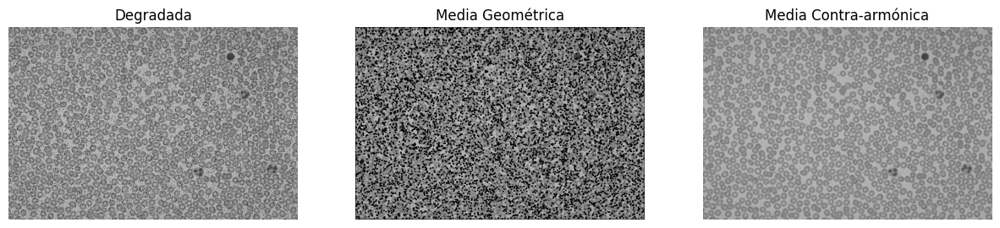

SOLO SAL
ECM Degradada vs Original: 617.83
ECM Media Geométrica: 240.97
ECM Media Contra-armónica (Q=-1.5): 274.10


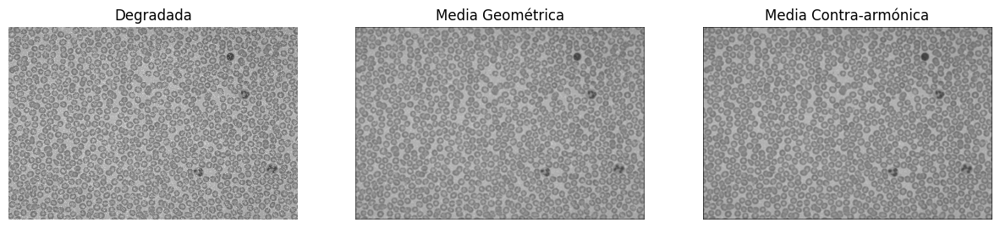

Q ERRONEO
ECM Degradada vs Original: 901.65
ECM Media Geométrica: 7047.05
ECM Media Contra-armónica (Q=-1.5): 7101.74


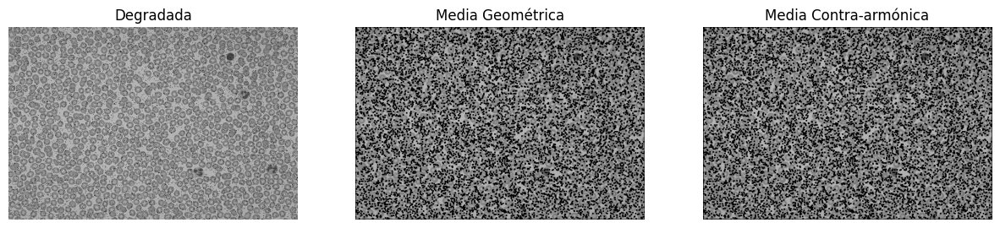

RUIDO MIXTO
ECM Degradada vs Original: 850.92
ECM Media Geométrica: 2402.29
ECM Media Contra-armónica (Q=0.0): 196.10


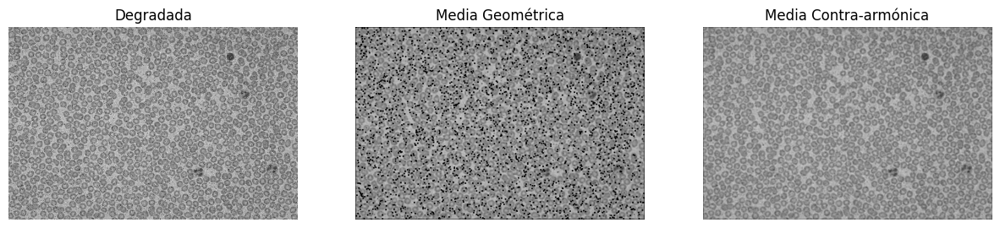

In [27]:
print("SOLO PIMIENTA")
filtros_de_medias(ratio_salpi=0.05, solo_sal=False, solo_pimienta=True, media=0, std=5, ksize=3, Q=1.5)
print("SOLO SAL")
filtros_de_medias(ratio_salpi=0.05, solo_sal=True, solo_pimienta=False, media=0, std=5, ksize=3, Q=-1.5)
print("Q ERRONEO")
filtros_de_medias(ratio_salpi=0.04, solo_sal=False, solo_pimienta=True, media=0, std=0, ksize=3, Q=-1.5)
print("RUIDO MIXTO")
filtros_de_medias(ratio_salpi=0.04, solo_sal=False, solo_pimienta=False, media=0, std=15, ksize=3, Q=0.0)

In [28]:
from ipywidgets import Checkbox

interact(
    filtros_de_medias,
    ratio_salpi=FloatSlider(min=0, max=1, step=0.01, value=0),
    solo_sal=Checkbox(value=False, description='Solo sal'),
    solo_pimienta=Checkbox(value=False, description='Solo pimienta'),
    media=FloatSlider(min=0, max=100, step=0.01, value=0),
    std=FloatSlider(min=1, max=100, step=0.01, value=0),
    ksize=IntSlider(min=1, max=51, step=2, value=1),
    Q=FloatSlider(min=-10, max=10, step=0.5, value=0)
);

interactive(children=(FloatSlider(value=0.0, description='ratio_salpi', max=1.0, step=0.01), Checkbox(value=Fa…

El filtro de media geométrica es malo contra el ruido de pimienta, ya que al multiplicar los pixeles en la ventana, un solo pixel 0 da como resultado 0. Es mejor contra el ruido de sal, pero aún así es peor que el de media contra-armónica, ya que solo los difumina.

El filtro de media contra-armónica es robusto contra el ruido de sal y de pimienta siempre y cuando Q esté bien elegido (Q > 0 para pimienta, Q < 0 para sal). En caso de elegir mal el Q, se empeorará la imagen.

En cuanto al ruido Gaussiano, el filtro de media-armónica es mejor por el simple hecho de no empeorar cuando hay grises muy oscuros, lo cual sí sucede con el de media geométrica. Esto puede mejorarse hasta cierto punto tomando un kernel más grande, pero estaremos emborronando más la imagen.

En lo que ambos filtros fallan es en no empeorar una imagen sin ruido.

##  Ejercicio 3: Filtros de orden

Utilizaremos filtros basados en ordenamiento estadístico (mediana, punto medio, media-alfa) para contrastar su desempeño contra los filtros de medias.

In [29]:
def aplicar_filtro_mediana(img, ksize=3):
    img_f = cv2.medianBlur(img, ksize)
    return np.clip(img_f, 0, 255).astype(np.uint8)

def aplicar_filtro_punto_medio(img, ksize=3):
    img_f = np.zeros(img.shape)

    # padding
    padsize = (ksize-1)//2
    im_p = cv2.copyMakeBorder(np.copy(img), *[padsize]*4, cv2.BORDER_CONSTANT,0).astype(np.float64)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            vMin, vMax = cv2.minMaxLoc(im_p[i:i+ksize,j:j+ksize])[0:2]
            img_f[i, j] = (vMin+vMax)/2

    return np.clip(img_f, 0, 255).astype(np.uint8)

def aplicar_filtro_media_alfa_recortado(img, ksize=3, d=8):
    img_f = np.zeros(img.shape)

    # padding
    padsize = (ksize-1)//2
    im_p = cv2.copyMakeBorder(np.copy(img), *[padsize]*4, cv2.BORDER_CONSTANT,0).astype(np.float64)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            S = np.sort(im_p[i:i+ksize,j:j+ksize].flatten())
            S = S[d//2:S.shape[0]-d//2]
            img_f[i, j] = np.sum(S)/S.shape[0]

    return np.uint8(img_f)

In [30]:
#  Filtros Estadísticos y Cascada
def filtros_de_orden(ratio_salpi, solo_sal, solo_pimienta, std, ksize=3, d=8):
    # aplicar sal y pimienta (o solo uno de los dos)
    img_degradada = img.copy()
    if solo_sal:
        sal = np.random.rand(img.shape[0], img.shape[1]) < ratio_salpi
        img_degradada[sal] = 255
    elif solo_pimienta:
        pim = np.random.rand(img.shape[0], img.shape[1]) < ratio_salpi
        img_degradada[pim] = 0
    else:
        img_degradada = aplicar_ruido_salpi(img, ratio_salpi)

    # aplicar gaussiano
    img_degradada = aplicar_ruido_gaussiano(img_degradada, 0, std)
    img_degradada = img_degradada.astype(np.float32)

    # a) Filtro de mediana
    img_mediana = aplicar_filtro_mediana(img_degradada, ksize)

    # b) Filtro del punto medio
    img_punto_medio = aplicar_filtro_punto_medio(img_degradada, ksize)

    # c) Filtro de media-alfa recortado
    img_alfa_recortado = aplicar_filtro_media_alfa_recortado(img_degradada, ksize, d)

    # d) Aplicación en cascada: filtro (a) seguido de (b)
    img_cascada = aplicar_filtro_punto_medio(aplicar_filtro_mediana(img_degradada, ksize), ksize)

    ecm_degradada = mse(img, img_degradada)
    ecm_mediana = mse(img, img_mediana)
    ecm_punto_medio = mse(img, img_punto_medio)
    ecm_alfa_recortado = mse(img, img_alfa_recortado)
    ecm_cascada = mse(img, img_cascada)

    print(f"ECM Degradada vs Original: {ecm_degradada:.2f}")
    print(f"ECM Mediana: {ecm_mediana:.2f}")
    print(f"ECM Punto medio: {ecm_punto_medio:.2f}")
    print(f"ECM Alfa recortado: {ecm_alfa_recortado:.2f}")
    print(f"ECM Mediana + Punto Medio: {ecm_cascada:.2f}")

    fig, ax = plt.subplots(1, 5, figsize=(15, 10))
    ax[0].imshow(img_degradada, cmap='gray', vmin=0, vmax=255); ax[0].set_title("Degradada"); ax[0].axis('off')
    ax[1].imshow(img_mediana, cmap='gray', vmin=0, vmax=255); ax[1].set_title("Mediana"); ax[1].axis('off')
    ax[2].imshow(img_punto_medio, cmap='gray', vmin=0, vmax=255); ax[2].set_title("Punto medio"); ax[2].axis('off')
    ax[3].imshow(img_alfa_recortado, cmap='gray', vmin=0, vmax=255); ax[3].set_title("Alfa recortado"); ax[3].axis('off')
    ax[4].imshow(img_cascada, cmap='gray', vmin=0, vmax=255); ax[4].set_title("Mediana + Punto Medio"); ax[4].axis('off')
    plt.show();


Solo S&P
ECM Degradada vs Original: 1383.82
ECM Mediana: 59.66
ECM Punto medio: 1653.87
ECM Alfa recortado: 90.26
ECM Mediana + Punto Medio: 254.47


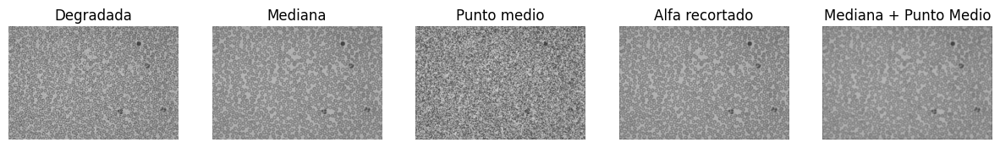

Solo Gaussiano
ECM Degradada vs Original: 1572.11
ECM Mediana: 350.63
ECM Punto medio: 407.38
ECM Alfa recortado: 282.42
ECM Mediana + Punto Medio: 323.67


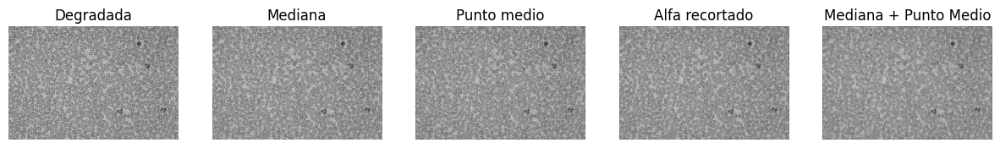

Mixto
ECM Degradada vs Original: 1490.36
ECM Mediana: 267.85
ECM Punto medio: 1165.35
ECM Alfa recortado: 295.68
ECM Mediana + Punto Medio: 481.83


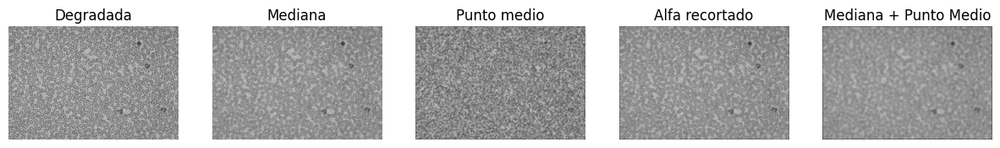

Mixto con menos S&P
ECM Degradada vs Original: 1202.56
ECM Mediana: 196.83
ECM Punto medio: 758.81
ECM Alfa recortado: 182.05
ECM Mediana + Punto Medio: 271.99


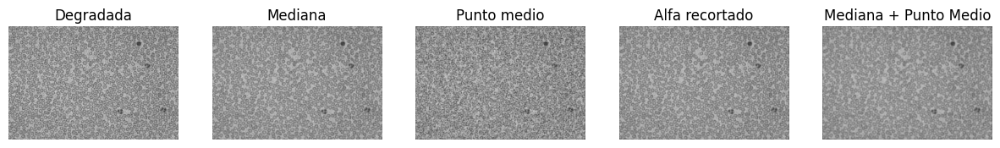

In [31]:
print("Solo S&P")
filtros_de_orden(ratio_salpi=0.08, solo_sal=False, solo_pimienta=False, std=0, ksize=3, d=4)
print("Solo Gaussiano")
filtros_de_orden(ratio_salpi=0.0, solo_sal=False, solo_pimienta=False, std=40, ksize=3, d=2)
print("Mixto")
filtros_de_orden(ratio_salpi=0.06, solo_sal=False, solo_pimienta=False, std=25, ksize=5, d=10)
print("Mixto con menos S&P")
filtros_de_orden(ratio_salpi=0.04, solo_sal=False, solo_pimienta=False, std=25, ksize=3, d=4)

In [32]:

interact(
    filtros_de_orden,
    ratio_salpi=FloatSlider(min=0, max=1, step=0.01, value=0),
    solo_sal=Checkbox(value=False, description='Solo sal'),
    solo_pimienta=Checkbox(value=False, description='Solo pimienta'),
    std=FloatSlider(min=1, max=100, step=0.01, value=0),
    ksize=IntSlider(min=3, max=51, step=2, value=3),
    d=IntSlider(min=1, max=15, step=1, value=8)
);

interactive(children=(FloatSlider(value=0.0, description='ratio_salpi', max=1.0, step=0.01), Checkbox(value=Fa…

El filtro de mediana es bueno para el ruido de sal y pimienta, igual que el alfa-recortado, ya que descartan los casos extremos dentro del kernel (donde va a cae la sal y la pimienta).

Contra el ruido de sal y pimienta, el filtro de mediana y el de alfa-recortados son buenos ya que descartan los valores extremos dentro del kernel (donde estará la sal y la pimienta). El de punto medio será la peor opción, ya que promediará principalmente ruido.

En el caso del ruido gaussiano, el promedio del filtro de punto medio suavizará el ruido, quedará una imagen "lavada" pero homogenea. En el caso de los otros, el resultado no es malo.

Cuando se presenta una combinación de S&P y gaussiano, el alfa recortado limpiará la sal y pimienta (extremos) y reducirá el ruido gaussiano con la media aritmética. El filtro de mediana no podrá limpiar el ruido gaussiano, y el filtro de punto medio no podrá resolver el ruido impulsivo. Combinar estos dos filtros, aplicando primero la mediana y luego el punto medio, puede dar un mejor resultado ya que primero se eliminará S&P y luego se suavizará el ruido gaussiano, pero no será tan bueno como el de alfa recortado.

## Ejercicio 4: Filtro adaptativo de reducción local del ruido

Filtro que ajusta su comportamiento basándose en la varianza estadística local de la imagen.

In [33]:
def aplicar_filtro_adaptativo_local(img, ksize, var_ruido):
    # var ruido es la varianza del ruido gaussiano
    img_degradada = img.astype(np.float32)

    # 1. media local E[X]
    media_local = cv2.blur(img_degradada, (ksize, ksize))

    # 2. varianza local E[X^2] - (E[X])^2
    media_cuadrados_local = cv2.blur(img_degradada**2, (ksize, ksize))
    var_local = media_cuadrados_local - (media_local**2)

    # 3. var_ruido no puede ser mayor que var_local.
    # Si var_local < var_ruido, ratio = 1
    # previene división por cero
    var_local = np.maximum(var_local, var_ruido)
    var_local[var_local == 0] = 1e-6

    # 4. Aplicar
    f_hat = img_degradada - (var_ruido / var_local) * (img_degradada - media_local)

    return np.clip(f_hat, 0, 255).astype(np.uint8)

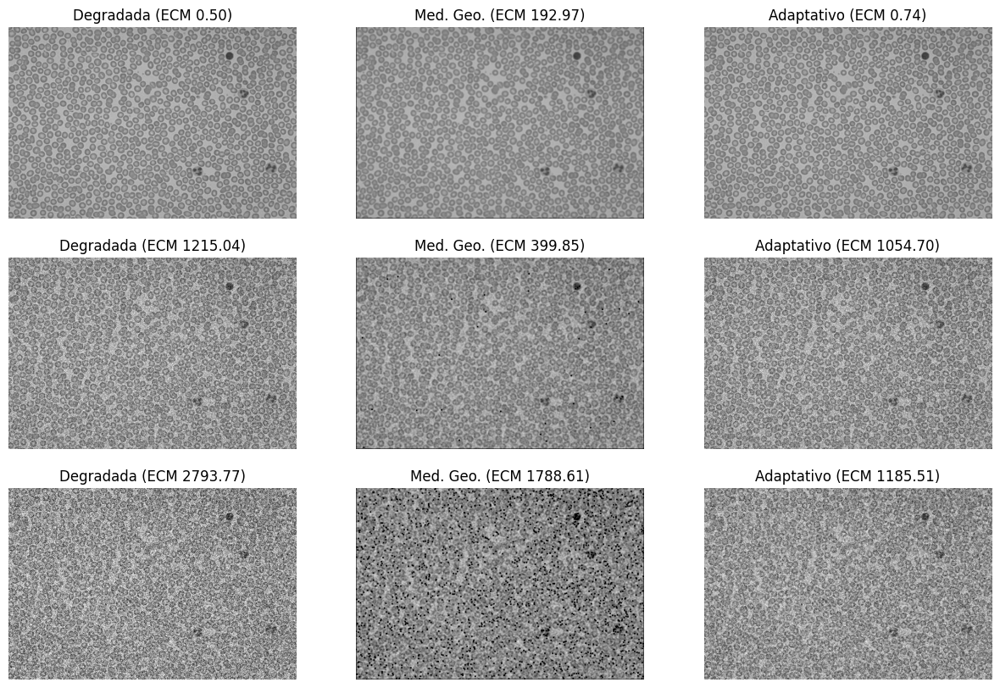

In [34]:
# Filtro Adaptativo
def filtro_adaptativo(ksize):
    # 1. Cargar imagen y agregar ruido gaussiano (media 0, var 0.01)
    img_degradada0 = aplicar_ruido_gaussiano(img, 0, 0.01)
    img_degradada0 = img_degradada0.astype(np.float32)
    img_degradada1 = aplicar_ruido_gaussiano(img, 0, 35)
    img_degradada1 = img_degradada1.astype(np.float32)
    img_degradada2 = aplicar_ruido_gaussiano(img, 0, 55)
    img_degradada2 = img_degradada2.astype(np.float32)

    # 2. Implementar algoritmo
    # Fórmula: f_hat = g - (var_ruido / var_local) * (g - media_local)
    # TODO: Calcular media_local y var_local usando cv2.blur o ndimage para cada pixel
    img_adapt0 = aplicar_filtro_adaptativo_local(img_degradada0, ksize, 0.01**2)
    img_adapt1 = aplicar_filtro_adaptativo_local(img_degradada1, ksize, 10**2)
    img_adapt2 = aplicar_filtro_adaptativo_local(img_degradada2, ksize, 35**2)

    # 3. Comparar con Media Geométrica del Ejercicio 2
    img_media_geom0 = aplicar_filtro_media_geometrica(img_degradada0, ksize)
    img_media_geom1 = aplicar_filtro_media_geometrica(img_degradada1, ksize)
    img_media_geom2 = aplicar_filtro_media_geometrica(img_degradada2, ksize)

    ecm_degradada0 = mse(img, img_degradada0)
    ecm_media_geom0 = mse(img, img_media_geom0)
    ecm_adapt0 = mse(img, img_adapt0)
    ecm_degradada1 = mse(img, img_degradada1)
    ecm_media_geom1 = mse(img, img_media_geom1)
    ecm_adapt1 = mse(img, img_adapt1)
    ecm_degradada2 = mse(img, img_degradada2)
    ecm_media_geom2 = mse(img, img_media_geom2)
    ecm_adapt2 = mse(img, img_adapt2)

    fig, ax = plt.subplots(3, 3, figsize=(15, 10))

    ax[0][0].imshow(img_degradada0, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title(f"Degradada (ECM {ecm_degradada0:.2f})"); ax[0][0].axis('off')
    ax[0][1].imshow(img_media_geom0, cmap='gray', vmin=0, vmax=255); ax[0][1].set_title(f"Med. Geo. (ECM {ecm_media_geom0:.2f})"); ax[0][1].axis('off')
    ax[0][2].imshow(img_adapt0, cmap='gray', vmin=0, vmax=255); ax[0][2].set_title(f"Adaptativo (ECM {ecm_adapt0:.2f})"); ax[0][2].axis('off')
    ax[1][0].imshow(img_degradada1, cmap='gray', vmin=0, vmax=255); ax[1][0].set_title(f"Degradada (ECM {ecm_degradada1:.2f})"); ax[1][0].axis('off')
    ax[1][1].imshow(img_media_geom1, cmap='gray', vmin=0, vmax=255); ax[1][1].set_title(f"Med. Geo. (ECM {ecm_media_geom1:.2f})"); ax[1][1].axis('off')
    ax[1][2].imshow(img_adapt1, cmap='gray', vmin=0, vmax=255); ax[1][2].set_title(f"Adaptativo (ECM {ecm_adapt1:.2f})"); ax[1][2].axis('off')
    ax[2][0].imshow(img_degradada2, cmap='gray', vmin=0, vmax=255); ax[2][0].set_title(f"Degradada (ECM {ecm_degradada2:.2f})"); ax[2][0].axis('off')
    ax[2][1].imshow(img_media_geom2, cmap='gray', vmin=0, vmax=255); ax[2][1].set_title(f"Med. Geo. (ECM {ecm_media_geom2:.2f})"); ax[2][1].axis('off')
    ax[2][2].imshow(img_adapt2, cmap='gray', vmin=0, vmax=255); ax[2][2].set_title(f"Adaptativo (ECM {ecm_adapt2:.2f})"); ax[2][2].axis('off')

    plt.show();

filtro_adaptativo(3);

##  Ejercicio 5: Eliminación de ruido periódico

Filtraremos interferencias sinusoidales en el dominio frecuencial utilizando filtros Rechaza-banda y Notch.



In [35]:
def apply_filter(img, mask):
    # dft y centrar
    f_transform = np.fft.fft2(img)
    f_shift = np.fft.fftshift(f_transform)

    # aplicar
    filtered_shift = f_shift * mask

    # invertir
    f_ishift = np.fft.ifftshift(filtered_shift)
    img_back = np.fft.ifft2(f_ishift)

    return np.abs(img_back)

def crear_mask_notch_ideal(img, u0, v0, r):
    crow, ccol = img.shape[0] // 2, img.shape[1] // 2
    mask = np.ones((img.shape[0], img.shape[1]), dtype=np.float32)

    for v in range(img.shape[0]):
        for u in range(img.shape[1]):
            # Distancia al primer centro de perturbación
            D1 = np.sqrt((v - crow - v0)**2 + (u - ccol - u0)**2)
            # Distancia al centro simétrico
            D2 = np.sqrt((v - crow + v0)**2 + (u - ccol + u0)**2)

            if D1 <= r or D2 <= r:
                mask[v, u] = 0.0

    return mask

def crear_mask_rechazabanda_ideal(img, r, ancho):
    crow, ccol = img.shape[0] // 2, img.shape[1] // 2

    # Matriz de distancias vectorizada
    u = np.arange(img.shape[1]) - ccol
    v = np.arange(img.shape[0]) - crow
    U, V = np.meshgrid(u, v)
    D = np.sqrt(U**2 + V**2)

    # Condición de corona circular
    mask = np.where((D >= (r - ancho/2)) & (D <= (r + ancho/2)), 0.0, 1.0)
    return mask

def crear_mask_rechazabanda_butter(img, r, ancho, n=1):
    crow, ccol = img.shape[0] // 2, img.shape[1] // 2

    u = np.arange(img.shape[1]) - ccol
    v = np.arange(img.shape[0]) - crow
    U, V = np.meshgrid(u, v)
    D = np.sqrt(U**2 + V**2)

    # Evitar división por cero en el centro exacto o donde D == r
    num = D * ancho
    den = D**2 - r**2
    # Evitamos problemas si el denominador es cero
    den[den == 0] = 1e-8

    mask = 1 / (1 + (num / den)**(2 * n))

    return mask

def crear_mask_rechazabanda_gauss(img, r, W):
    crow, ccol = img.shape[0] // 2, img.shape[1] // 2

    u = np.arange(img.shape[1]) - ccol
    v = np.arange(img.shape[0]) - crow
    U, V = np.meshgrid(u, v)
    D = np.sqrt(U**2 + V**2)

    num = D**2 - r**2
    den = D * W
    den[den == 0] = 1e-8

    mask = 1.0 - np.exp(-0.5 * (num / den)**2)

    return mask

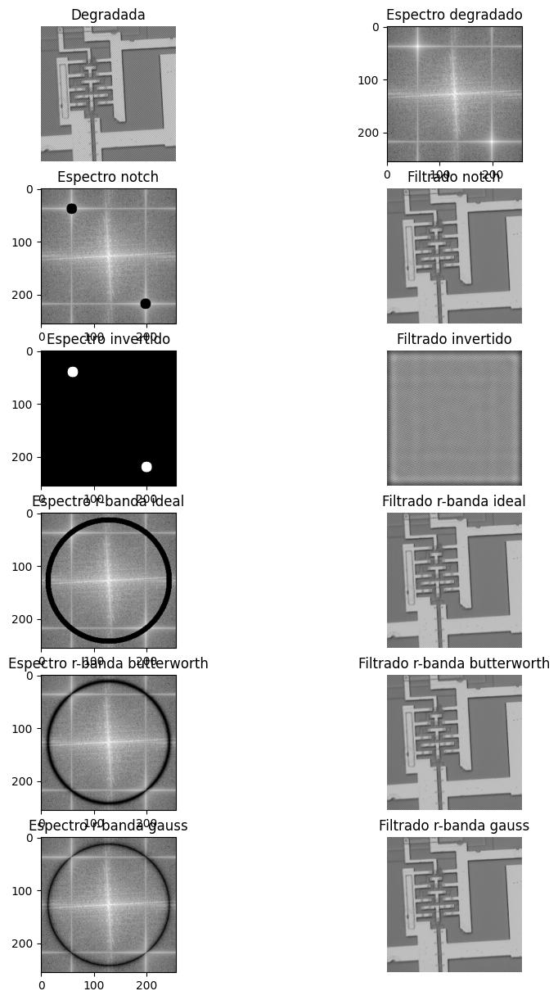

In [36]:
# Filtros Rechaza-banda y Notch Frecuenciales
img = cv2.imread('imagenes/img_degradada.tif', cv2.IMREAD_GRAYSCALE)
def ruido_periodico():
    # 1. Obtener espectro de Fourier
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    mag = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]) + 1)

    # 2. Localizar picos del ruido (las "estrellas" brillantes fuera del centro)
    filas, cols = img.shape

    # 3. Crear filtros
    mask_notch_ideal = crear_mask_notch_ideal(img, 70, 90, 10)
    mask_rechaza_ideal = crear_mask_rechazabanda_ideal(img, 115, 10)
    mask_rechaza_butter = crear_mask_rechazabanda_butter(img, 115, 15, 2)
    mask_rechaza_gauss = crear_mask_rechazabanda_gauss(img, 115, 15)

    # 4. Filtrar y transformar de vuelta
    img_notch_ideal = apply_filter(img, mask_notch_ideal)
    # para visualizar nomas
    dft_shift_notch_ideal = dft_shift * mask_notch_ideal[:, :, np.newaxis]
    img_rechaza_ideal = apply_filter(img, mask_rechaza_ideal)
    dft_shift_rechaza_ideal = dft_shift * mask_rechaza_ideal[:, :, np.newaxis]
    img_rechaza_butter = apply_filter(img, mask_rechaza_butter)
    dft_shift_rechaza_butter = dft_shift * mask_rechaza_butter[:, :, np.newaxis]
    img_rechaza_gauss = apply_filter(img, mask_rechaza_gauss)
    dft_shift_rechaza_gauss = dft_shift * mask_rechaza_gauss[:, :, np.newaxis]

    # 5. Imagen de SOLO RUIDO
    mask_notch_i = np.zeros((filas, cols, 2), np.float32)
    mask_notch_i = cv2.circle(mask_notch_i, (60, 40), 10, (255,255), -1)
    mask_notch_i = cv2.circle(mask_notch_i, (200, 220), 10, (255,255), -1)
    dft_shift_f_i = dft_shift * mask_notch_i
    dft_f_i = np.fft.ifftshift(dft_shift_f_i)
    idft_f_i = cv2.idft(dft_f_i, flags=cv2.DFT_SCALE)
    mag_f_i = cv2.magnitude(idft_f_i[:,:,0], idft_f_i[:,:,1])
    img_f_i = cv2.normalize(mag_f_i, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Visualizar Espectro, Máscara, Restaurada y Solo Ruido
    fig, ax = plt.subplots(6, 2, figsize=(10, 15))

    ax[0][0].imshow(img, cmap='gray', vmin=0, vmax=255); ax[0][0].set_title(f"Degradada"); ax[0][0].axis('off')
    ax[0][1].imshow(mag, cmap='gray', vmin=0, vmax=255); ax[0][1].set_title(f"Espectro degradado")
    ax[1][0].imshow(20 * np.log(cv2.magnitude(dft_shift_notch_ideal[:,:,0], dft_shift_notch_ideal[:,:,1]) + 1), cmap='gray', vmin=0, vmax=255); ax[1][0].set_title(f"Espectro notch")
    ax[1][1].imshow(img_notch_ideal, cmap='gray', vmin=0, vmax=255); ax[1][1].set_title(f"Filtrado notch"); ax[1][1].axis('off')
    ax[2][0].imshow(20 * np.log(cv2.magnitude(dft_shift_f_i[:,:,0], dft_shift_f_i[:,:,1]) + 1), cmap='gray', vmin=0, vmax=255); ax[2][0].set_title(f"Espectro invertido")
    ax[2][1].imshow(img_f_i, cmap='gray', vmin=0, vmax=255); ax[2][1].set_title(f"Filtrado invertido"); ax[2][1].axis('off')
    ax[3][0].imshow(20 * np.log(cv2.magnitude(dft_shift_rechaza_ideal[:,:,0], dft_shift_rechaza_ideal[:,:,1]) + 1), cmap='gray', vmin=0, vmax=255); ax[3][0].set_title(f"Espectro r-banda ideal")
    ax[3][1].imshow(img_rechaza_ideal, cmap='gray', vmin=0, vmax=255); ax[3][1].set_title(f"Filtrado r-banda ideal"); ax[3][1].axis('off')
    ax[4][0].imshow(20 * np.log(cv2.magnitude(dft_shift_rechaza_butter[:,:,0], dft_shift_rechaza_butter[:,:,1]) + 1), cmap='gray', vmin=0, vmax=255); ax[4][0].set_title(f"Espectro r-banda butterworth")
    ax[4][1].imshow(img_rechaza_butter, cmap='gray', vmin=0, vmax=255); ax[4][1].set_title(f"Filtrado r-banda butterworth"); ax[4][1].axis('off')
    ax[5][0].imshow(20 * np.log(cv2.magnitude(dft_shift_rechaza_gauss[:,:,0], dft_shift_rechaza_gauss[:,:,1]) + 1), cmap='gray', vmin=0, vmax=255); ax[5][0].set_title(f"Espectro r-banda gauss")
    ax[5][1].imshow(img_rechaza_gauss, cmap='gray', vmin=0, vmax=255); ax[5][1].set_title(f"Filtrado r-banda gauss"); ax[5][1].axis('off')

    plt.show();

ruido_periodico();

El ruido aparece en pares porque siempre a una frecuencia le corresponde su conjugado, y no aparece ne el centro del espectro porque corresponde a lineas con una cierta frecuencia, no un brillo constante en toda la imagen. Aunque aplicar un filtro rechazabanda en anillo es mas sencillo, pierde mucha mas informacion de otras bandas de frecuencias (que pueden ser vitales).

##  Ejercicio 6: Restauración por filtrado de Wiener (Deconvolución)

Traduciremos la lógica de restauración matemática que combate el desenfoque por movimiento o fuera de foco (de-convolución)

---
* Migrar el tutorial de OpenCV en C++ a Python:
   * [Out of focus deblur](https://docs.opencv.org/trunk/de/d3c/tutorial_out_of_focus_deblur_filter.html)
   * [Motion deblur](https://docs.opencv.org/trunk/d1/dfd/tutorial_motion_deblur_filter.html)


In [37]:
def generar_psf_foco(shape, radio):
    psf = np.zeros(shape, dtype=np.float32)
    cy, cx = shape[0] // 2, shape[1] // 2
    # disco blanco en el centro
    cv2.circle(psf, (cx, cy), radio, 255, -1)
    # normalizar hasta energia 1
    psf /= psf.sum()
    return np.fft.ifftshift(psf)

def generar_psf_movimiento(shape, longitud, angulo):
    psf = np.zeros(shape, dtype=np.float32)
    cy, cx = shape[0] // 2, shape[1] // 2

    # extremos de la linea segun angulo
    angulo_rad = np.deg2rad(angulo)
    dx = int(np.round((longitud / 2) * np.cos(angulo_rad)))
    dy = int(np.round((longitud / 2) * np.sin(angulo_rad)))

    cv2.line(psf, (cx - dx, cy - dy), (cx + dx, cy + dy), 255, 1)
    psf /= psf.sum()
    return np.fft.ifftshift(psf)

def aplicar_filtro_wiener(img_degradada, psf, K=0.001):
    """
    Implementa el Filtro de Wiener en el dominio de la frecuencia.

    :param img_degradada: Imagen con deblur en escala de grises (float32 o uint8).
    :param psf: Matriz del mismo tamaño que la imagen con el modelo de degradación.
    :param K: Constante que simula 1/SNR. Valores más chicos recuperan más nitidez
              pero amplifican el ruido.
    """
    # 1. TDF de la imagen degradada G(u,v)
    G = np.fft.fft2(img_degradada)

    # 2. Generar el modelo de degradación H(u,v)
    H = np.fft.fft2(psf)

    # 3. Calcular la función del filtro de Wiener: W(u,v) = H*(u,v) / (|H(u,v)|^2 + K)
    H_conj = np.conj(H)
    H_mag_cuadrado = np.abs(H) ** 2

    W = H_conj / (H_mag_cuadrado + K)

    # 4. Estimar F_hat(u,v) = W(u,v) * G(u,v)
    F_hat = W * G

    # 5. TDF Inversa para recuperar f_hat(x,y)
    f_hat = np.fft.ifft2(F_hat)

    f_hat = np.real(f_hat)
    return np.clip(f_hat, 0, 255).astype(np.uint8)


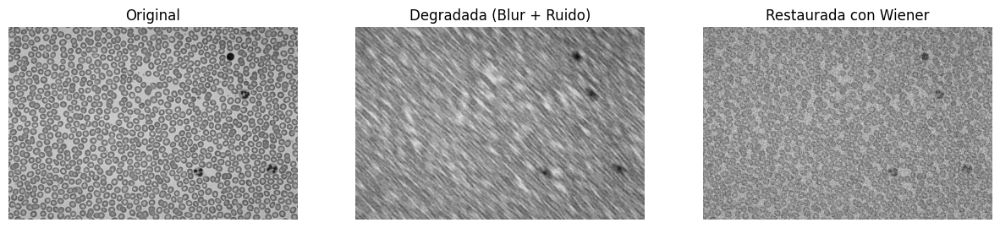

In [38]:
# Cargar la imagen original en grises
img_original = cv2.imread('imagenes/sangre.jpg', cv2.IMREAD_GRAYSCALE)

# simular desenfoque
# 1. psf de movimiento
psf_mov = generar_psf_movimiento(img_original.shape, longitud=20, angulo=45)

# 2. conv con psf
F_original = np.fft.fft2(img_original)
H_mov = np.fft.fft2(psf_mov)
img_borrosa = np.real(np.fft.ifft2(F_original * H_mov))

# 3. ruido gaussiano para simular foto real
ruido_gauss = np.random.normal(0, 5, img_original.shape)
img_degradada = np.clip(img_borrosa + ruido_gauss, 0, 255).astype(np.uint8)

# restaurar
img_restaurada = aplicar_filtro_wiener(img_degradada, psf_mov, K=0.005)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img_original, cmap='gray'); ax[0].set_title("Original"); ax[0].axis('off')
ax[1].imshow(img_degradada, cmap='gray'); ax[1].set_title("Degradada (Blur + Ruido)"); ax[1].axis('off')
ax[2].imshow(img_restaurada, cmap='gray'); ax[2].set_title("Restaurada con Wiener"); ax[2].axis('off')
plt.show()

El enfoque de los filtros inversos simples falla porque no tiene en cuenta el proceso fisico de la degradacion por motion blur y cualquier ruido puede verse amplificado. El filtro de Wiener calcula un equilibrio estimando la SNR.

## Ejercicio 7: Trabajo de Aplicación

Selección de estrategias sobre imágenes (FAMILIA_a.jpg, FAMILIA_b.jpg, FAMILIA_c.jpg)

---

* Seleccionar un parche o ROI de la imagen que debería ser homogéneo
* Dibujar histograma de ROI para inferir la distribución estadística
* Obtener parámetros del ruido
* Basado en el tipo de ruido detectado (Gaussiano, Impulsivo, Periódico, etc.), seleccionar el filtro espacial o frecuencial programado en ejercicios anteriores y ajustar los parámetros.

Analisis de imagenes

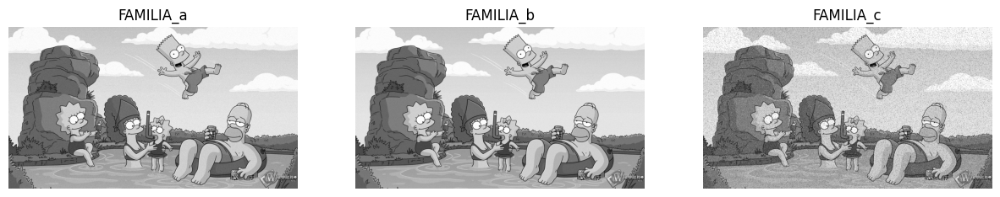

In [39]:
familiaA = cv2.imread('imagenes/FAMILIA_a.jpg')
familiaB = cv2.imread('imagenes/FAMILIA_b.jpg')
familiaC = cv2.imread('imagenes/FAMILIA_c.jpg')

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(familiaA, cmap='gray'); ax[0].set_title("FAMILIA_a"); ax[0].axis('off')
ax[1].imshow(familiaB, cmap='gray'); ax[1].set_title("FAMILIA_b"); ax[1].axis('off')
ax[2].imshow(familiaC, cmap='gray'); ax[2].set_title("FAMILIA_c"); ax[2].axis('off');

En la region marcada se sacó el histograma. El ruido detectado parece ser de tipo Gaussiano (FAMILIA_b) y de tipo impulsivo (FAMILIA_c)

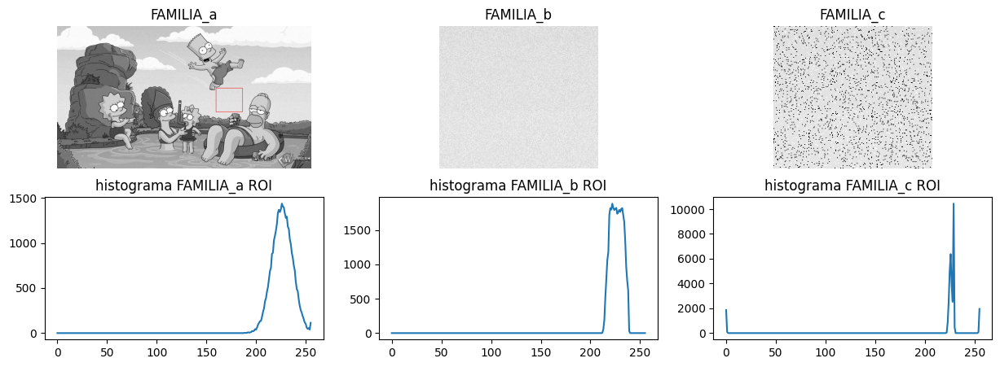

In [40]:
histA, histB, histC = cv2.calcHist([familiaA[470:650, 1200:1400]],[0],None,[256],[0,256]), cv2.calcHist([familiaB[470:650, 1200:1400]],[0],None,[256],[0,256]), cv2.calcHist([familiaC[470:650, 1200:1400]],[0],None,[256],[0,256])

familiaA_roi = cv2.rectangle(familiaA, (1200, 470), (1400, 650), (255, 0, 0), 2)

fig, ax = plt.subplots(2, 3, figsize=(15, 5))
ax[0][0].imshow(familiaA_roi, cmap='gray'); ax[0][0].set_title("FAMILIA_a"); ax[0][0].axis('off')
ax[0][1].imshow(familiaB[470:650, 1200:1400], cmap='gray'); ax[0][1].set_title("FAMILIA_b"); ax[0][1].axis('off')
ax[0][2].imshow(familiaC[470:650, 1200:1400], cmap='gray'); ax[0][2].set_title("FAMILIA_c"); ax[0][2].axis('off')
ax[1][0].plot(histA); ax[1][0].set_title("histograma FAMILIA_a ROI");
ax[1][1].plot(histB); ax[1][1].set_title("histograma FAMILIA_b ROI");
ax[1][2].plot(histC); ax[1][2].set_title("histograma FAMILIA_c ROI");

Filtrar
- familiaB: ruido de tipo gaussiano, aplicar filtro de mediana
- familiaC: ruido de tipo impulsivo, aplicar filtro de alfa recortado

ECM Familia B vs A: 485.41
ECM Familia B restaurada con mediana (ksize 3): 477.50
ECM Familia B restaurada con mediana (ksize 5): 793.67
ECM Familia C vs A: 7815.44
ECM Familia C restaurada con alfa-recortado (ksize 3, d 4): 1148.15
ECM Familia C restaurada alfa-recortado (ksize 5, d 10) + mediana (ksize 3): 981.17


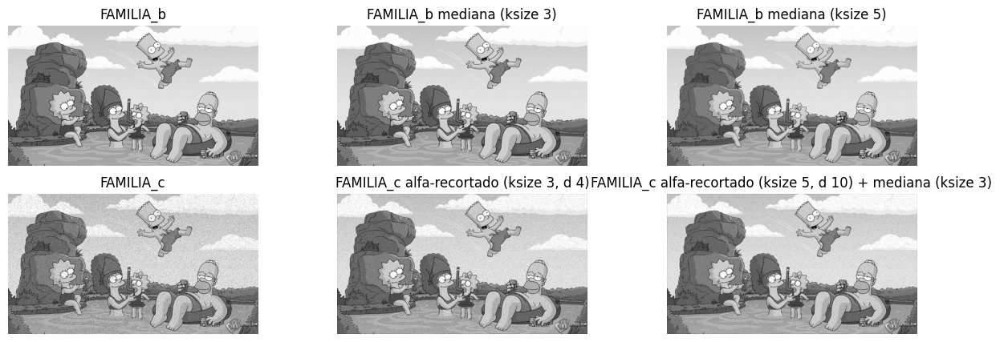

In [41]:
# Análisis de Imágenes
def aplicacion_familia():
    familiaB_restaurada0 = aplicar_filtro_mediana(familiaB, ksize=3)
    familiaB_restaurada1 = aplicar_filtro_mediana(familiaB, ksize=5)
    familiaC_restaurada0 = aplicar_filtro_media_alfa_recortado(familiaC, ksize=3, d=4)
    familiaC_restaurada1 = aplicar_filtro_mediana(aplicar_filtro_media_alfa_recortado(familiaC, ksize=3, d=4), ksize=3)

    # 4. Evaluación cuantitativa (ECM/MSE)
    ecm_familiaB = mse(familiaA, familiaB)
    ecm_familiaB_restaurada0 = mse(familiaA, familiaB_restaurada0)
    ecm_familiaB_restaurada1 = mse(familiaA, familiaB_restaurada1)
    ecm_familiaC = mse(familiaA, familiaC)
    ecm_familiaC_restaurada0 = mse(familiaA, familiaC_restaurada0)
    ecm_familiaC_restaurada1 = mse(familiaA, familiaC_restaurada1)

    print(f"ECM Familia B vs A: {ecm_familiaB:.2f}")
    print(f"ECM Familia B restaurada con mediana (ksize 3): {ecm_familiaB_restaurada0:.2f}")
    print(f"ECM Familia B restaurada con mediana (ksize 5): {ecm_familiaB_restaurada1:.2f}")
    print(f"ECM Familia C vs A: {ecm_familiaC:.2f}")
    print(f"ECM Familia C restaurada con alfa-recortado (ksize 3, d 4): {ecm_familiaC_restaurada0:.2f}")
    print(f"ECM Familia C restaurada alfa-recortado (ksize 5, d 10) + mediana (ksize 3): {ecm_familiaC_restaurada1:.2f}")

    fig, ax = plt.subplots(2, 3, figsize=(15, 5))
    ax[0][0].imshow(familiaB, cmap='gray'); ax[0][0].set_title("FAMILIA_b"); ax[0][0].axis('off');
    ax[0][1].imshow(familiaB_restaurada0, cmap='gray'); ax[0][1].set_title("FAMILIA_b mediana (ksize 3)"); ax[0][1].axis('off');
    ax[0][2].imshow(familiaB_restaurada1, cmap='gray'); ax[0][2].set_title("FAMILIA_b mediana (ksize 5)"); ax[0][2].axis('off');
    ax[1][0].imshow(familiaC, cmap='gray'); ax[1][0].set_title("FAMILIA_c"); ax[1][0].axis('off');
    ax[1][1].imshow(familiaC_restaurada0, cmap='gray'); ax[1][1].set_title("FAMILIA_c alfa-recortado (ksize 3, d 4)"); ax[1][1].axis('off');
    ax[1][2].imshow(familiaC_restaurada1, cmap='gray'); ax[1][2].set_title("FAMILIA_c alfa-recortado (ksize 5, d 10) + mediana (ksize 3)"); ax[1][2].axis('off');

aplicacion_familia()

En el caso de `familia_b` el ruido es muy leve, por lo que la mejora que se consigue es mínima y rápidamente un kernel más rápido la empeora.

En el caso de `familia_c` la mejora es significativa solo eliminando el ruido impulsivo con alfa-recortado, pero se logra una mejora aún mayor aplicando luego un filtro de mediana.